## **TASK 1**

The below code is starting about the gaussian distribution which is the very base of regression (different types of kernels). It firstly divides the main equation into small different parts which in further consummate to yield gaussian distribution which are bivariate and all plots are mostly handled by plotly library as it provide diversed resources for plotting.



---



In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as FuncAnimation

def np_bivariate_normal_pdf(domain, mean, variance):
  X = np.arange(-domain+mean, domain+mean, variance)
  Y = np.arange(-domain+mean, domain+mean, variance)
  X, Y = np.meshgrid(X, Y)
  R = np.sqrt(X**2 + Y**2)
  Z = ((1. / np.sqrt(2 * np.pi)) * np.exp(-.5*R**2))
  return X+mean, Y+mean, Z
  
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

def plt_plot_bivariate_normal_pdf(x, y, z, name=""):
  fig = plt.figure(figsize=(12, 6))
  ax = fig.gca(projection='3d')
  ax.plot_surface(x, y, z, 
                  cmap=cm.coolwarm,
                  linewidth=0, 
                  antialiased=True)
  ax.set_xlabel('x')
  ax.set_ylabel('y')
  ax.set_zlabel('z');
  plt.show()


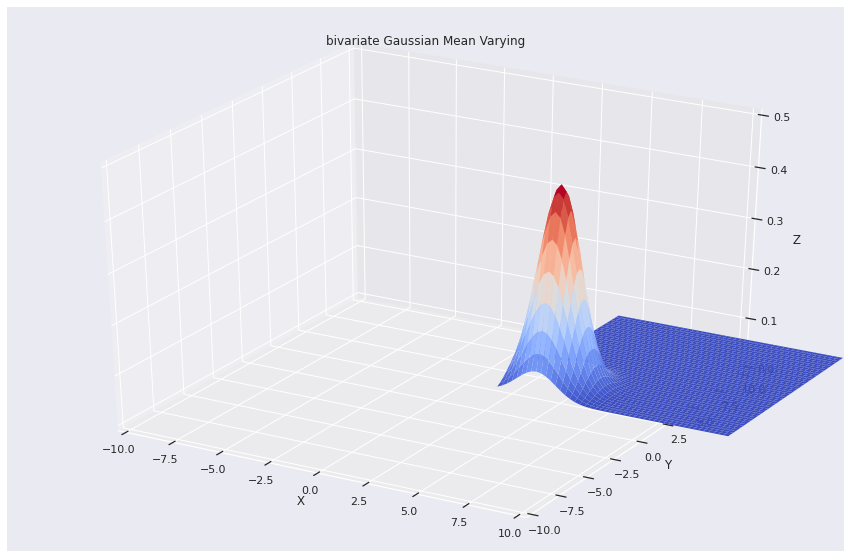

In [4]:
from matplotlib import rc
rc('animation', html='jshtml')

from math import *
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import matplotlib.animation as animation

fig = plt.figure(figsize=(15,10))
ax = fig.gca(projection='3d')
def init():  
    ax.set_xlim3d(-10, 10)  
    ax.set_ylim3d(-10, 10)
    ax.set_zlim3d(0, 0.5)  

def frame1(i):
    ax.clear()
    plt.title("bivariate Gaussian Mean Varying")
    lx,ly,lz=(np_bivariate_normal_pdf(6, i, 0.25))
    ax.set_xlabel(' X ')
    ax.set_ylabel(' Y ')
    ax.set_zlabel(' Z ')
    plot=  ax.plot_surface(lx, ly, lz, 
                  cmap=cm.coolwarm,
                  linewidth=0, 
                  antialiased=True)
    return plot
anim_mean_varying = animation.FuncAnimation(fig, frame1, np.arange(-5, 5, 1),  init_func=init)
anim_mean_varying

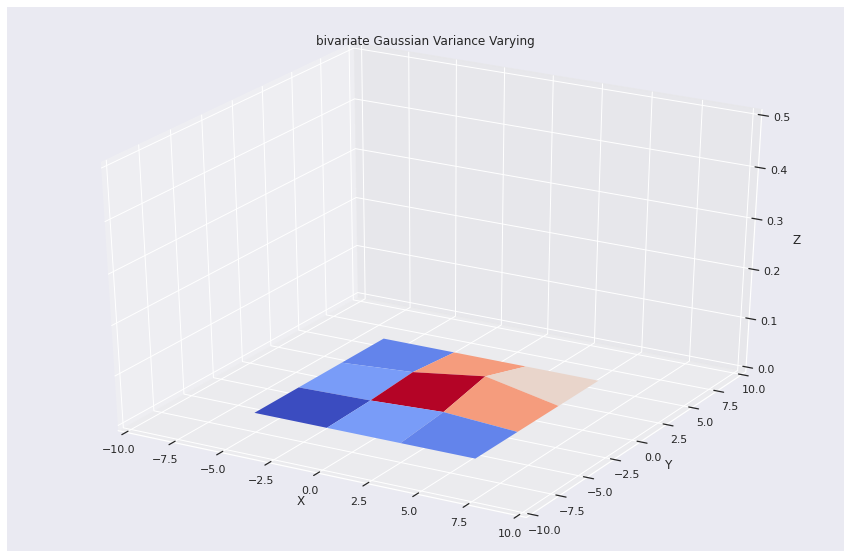

In [5]:
fig2 = plt.figure(figsize=(15,10))
ax2 = fig2.gca(projection='3d')

def init():  
    ax2.set_xlim3d(-10, 10)  
    ax2.set_ylim3d(-10, 10)
    ax2.set_zlim3d(0, 0.5) 

def frame2(i):
    ax2.clear()
    plt.title("bivariate Gaussian Variance Varying")

    lx,ly,lz=(np_bivariate_normal_pdf(6, 0, i))
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_zlabel('Z')
    plot=  ax2.plot_surface(lx, ly, lz, 
                  cmap=cm.coolwarm,
                  linewidth=0, 
                  antialiased=True)
    return plot

anim_variance_varying = animation.FuncAnimation(fig2, frame2, np.arange(-2, 4, 0.2),  init_func=init)
anim_variance_varying

## **TASK 2**

Cholesky Decomposition is used in this code for constructing valid covariance matrix which will help us to get multiple samples of gaussian distribution for N=3 and N=5. In, reality we need our base covariance matrix positive definite (basic for gaussian distribution). 

---


Covariance matrix should be positive definite and for generating samples i have used np.random.mormal()



In [2]:
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
 
# Define dimension. 
d = 3
# Set mean vector. 
m_3 = np.array([1, 2, 3]).reshape(3, 1)
# Set covariance function. Positive Definite
K_3 = np.array([[2, -1, 0],
                [-1, 2, -1], 
                [0, -1, 2]])

#print(np.linalg.eigvals(K_3))
epsilon = 0.0001 # For noise

# Add small pertturbation. 
K = K_3 + epsilon*np.identity(d)

#  Cholesky decomposition.
L = np.linalg.cholesky(K)

#print(L)
#print(np.dot(L, np.transpose(L)))
 
# Number of samples. 
n = 10000
u = np.random.normal(loc=0, scale=1, size=d*n).reshape(d, n)
x_3 = m_3 + np.dot(L, u)
print(' ')
print('BELOW ARE GENERATED 3-D SAMPLES')
print(x_3.shape)
print(' ')
print(x_3)
#sns.jointplot(x=x[0], y=x[1], kind="kde", space=0);

 
BELOW ARE GENERATED 3-D SAMPLES
(3, 10000)
 
[[ 2.8193668  -0.73481354  2.0692977  ...  1.53649459  3.50501961
   3.78240555]
 [ 4.53290091  2.81719272  0.47077237 ...  1.69205681 -0.1686567
  -0.11788147]
 [ 1.48591455  2.84038586  4.36961734 ...  2.69370658  2.42748773
   3.51105534]]


In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

# Define dimension. 
d = 5
# Set mean vector. 
m_5 = np.array([1, 2, 3, 4, 5]).reshape(5, 1)
# Set covariance function. 
# A Toeplitz matrix with eigen value 0.5484316
K_5 = np.array([[5, 4, 3, 2, 1],
                [4, 5, 4, 3, 2],
                [3, 4, 5, 4, 3],
                [2, 3, 4, 5, 4], 
                [1, 2, 3, 4, 5]])
#print(np.linalg.eigvals(K_5))

epsilon = 0.0001 # For noise 
# Add small pertturbation. 
K = K_5 + epsilon*np.identity(d)

#  Cholesky decomposition.
L = np.linalg.cholesky(K)
#print(L)
#print(np.dot(L, np.transpose(L)))


# Number of samples. 
n = 10000

u = np.random.normal(loc=0, scale=1, size=d*n).reshape(d, n)
x_5 = m_5 + np.dot(L, u)
print(' ')
print('BELOW ARE GENERATED 5-D SAMPLES')
print(x_5.shape)
print(' ')
print(x_5)
#sns.jointplot(x=x[0], y=x[1], kind="kde", space=0);

 
BELOW ARE GENERATED 5-D SAMPLES
(5, 10000)
 
[[-0.32466475  1.35605273 -0.179146   ...  3.08520947  3.34075125
   0.89030487]
 [ 2.15769773  2.03244913  0.71779135 ...  4.05294979  5.80417477
   4.11936149]
 [ 2.80316254  2.40576174  3.26734186 ...  3.81672337  6.25334699
   6.16396553]
 [ 3.21503079  3.36600132  5.5233208  ...  3.3389071   7.89235142
   8.68526308]
 [ 3.28730839  3.99587984  4.44535487 ...  4.19623289  8.94293103
   8.79187803]]


## **TASK 3**

Here, actual and obtained values of mean, variance and covariance are compared to get a picture that contructed and generated samples resembles with original ones, which, in long run helps us to visualize the data more precisely.



---

Library used for this task is only numpy and result are very close to each other.

In [ ]:
from numpy import cov, var # Covariance and Variance

# N = 3
print('FOR 3-D')

# Mean
m_3_calculated = []
for i in range(3):
  m_3_calculated.append(x_3[i].mean())
print(m_3_calculated)
print(m_3.T)
print("\n")

# Covariance
cov_3_calculated = cov(x_3)
print(cov_3_calculated)
print(K_3)
print('\n')

# Variance
col_var_3 = var(x_3, ddof=1, axis=0)
print(col_var_3)
row_var_3 = var(x_3, ddof=1, axis=1)
print(row_var_3)
print("\n")
print("\n")





# N = 5
print('FOR 5-D')

# Mean
m_5_calculated = []
for i in range(5):
  m_5_calculated.append(x_5[i].mean())
print(m_5_calculated)
print(m_5.T)
print("\n")

# Covariance
cov_5_calculated = cov(x_3)
print(cov_5_calculated)
print(K_5)
print('\n')

# Variance
col_var_5 = var(x_5, ddof=1, axis=0)
print(col_var_5)
row_var_5 = var(x_5, ddof=1, axis=1)
print(row_var_5)
print("\n")
print("\n")

FOR 3-D
[0.9955029580805412, 2.0037223684560246, 2.992654252165237]
[[1 2 3]]


[[ 1.97611215 -0.97193609 -0.01790167]
 [-0.97193609  1.94726053 -0.95366355]
 [-0.01790167 -0.95366355  1.99357745]]
[[ 2 -1  0]
 [-1  2 -1]
 [ 0 -1  2]]


[ 0.18280305  0.73353602  4.52498004 ... 13.1970736   1.68008268
  5.04976371]
[1.97611215 1.94726053 1.99357745]




FOR 5-D
[0.9769151749628212, 1.9743550599479354, 2.957459592671535, 3.962612524059576, 4.958603115303966]
[[1 2 3 4 5]]


[[ 1.97611215 -0.97193609 -0.01790167]
 [-0.97193609  1.94726053 -0.95366355]
 [-0.01790167 -0.95366355  1.99357745]]
[[5 4 3 2 1]
 [4 5 4 3 2]
 [3 4 5 4 3]
 [2 3 4 5 4]
 [1 2 3 4 5]]


[ 2.4248087  16.69935832  5.7517975  ...  1.44244803 14.40152558
  4.4333486 ]
[4.98385921 5.02343889 5.048568   5.01774    5.06534085]






## **TASK 4**

For this part, dimension of gaussian are shoot up to 100 dimensions in order to see how covariance function i.e. kernel works and how it yields us a covariance matrix. Also, all 3 kernels which are developed in code are visualized through a heatmap. 

---

hyperparameter here is 'l' which provides us insight about the covariance matrix and how we could observe different pattern in it.

**In all three covariance functions we could observe through heatmap that maximum value of matrix is seen across the diagonal of 100 x 100 matrix and all other sides are gradually decreasing in absolute terms which provides us the gaussian insight. There are other parameters like (standard deviation^2) alpha(in RQ kernel) which also contributes to the shape of heatmap** 

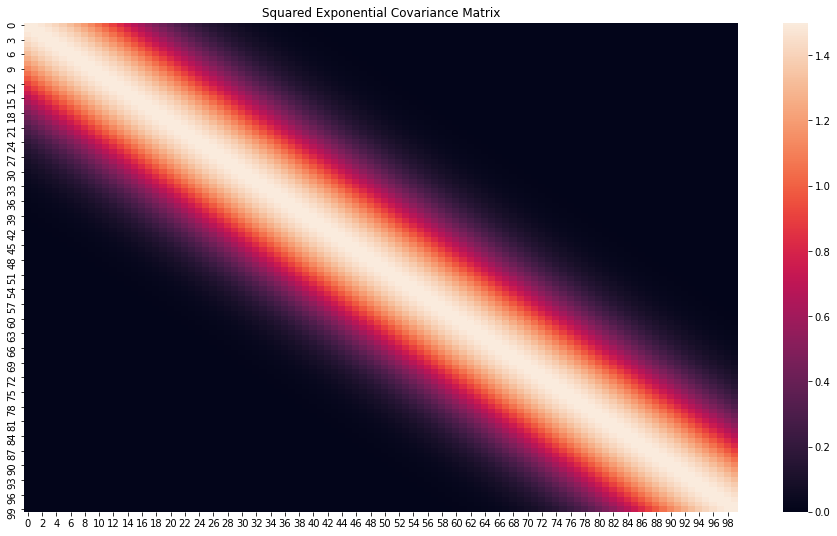

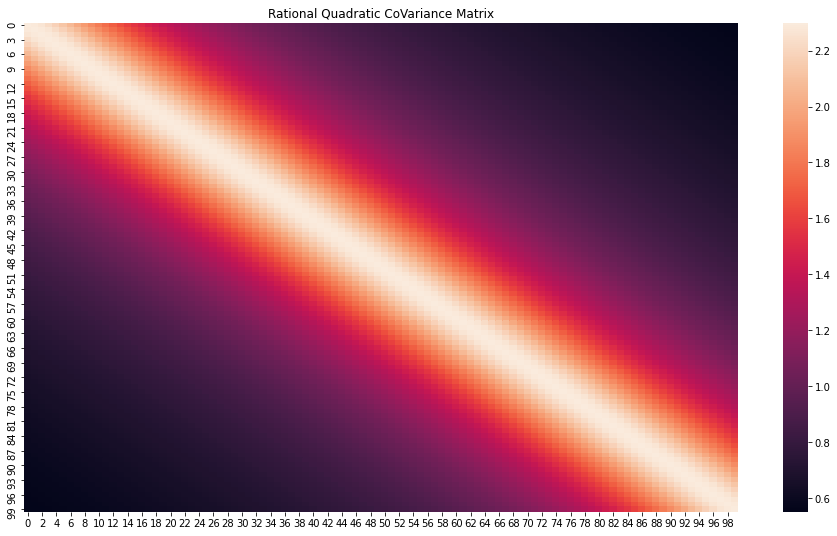

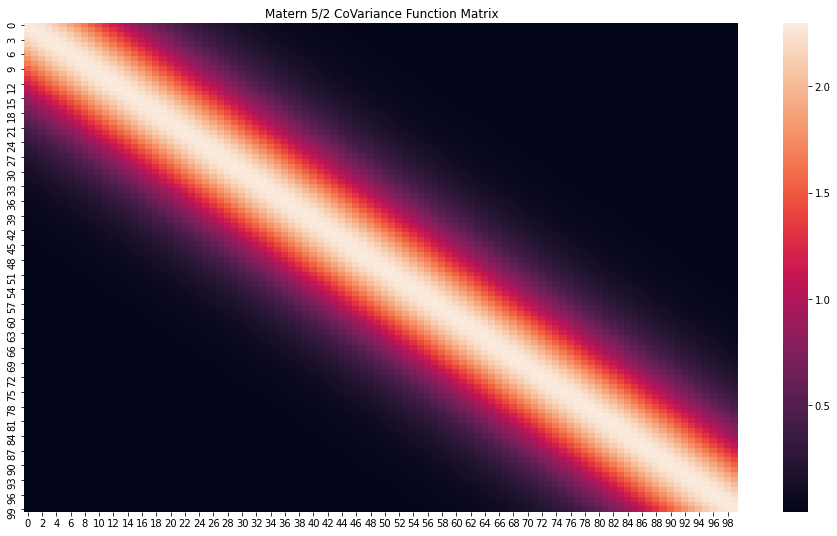

In [8]:
import numpy as np
import matplotlib .pyplot as plt
from scipy.stats import multivariate_normal
import seaborn as sns

m = 100 # Number of dimension of gaussian distribution
xs = np. linspace (-5,5,m) # Test input vector (1D equal spaced inputs)
mxs = np.zeros(m) # Zero mean vector

# ( [100, 1] - [1, 100] = [100, 100])
r = (np.abs(xs[:,np.newaxis]-xs[:,np.newaxis ].T)) # (X- Y), as difference of two inputs is needed for kernel and to make dimension (100 x 100) 

# Squared Exponential CoVariance Function
l = 1.2 # hyperparameters
sf2 = 1.5
def covMatrix_SE(l, sf2): # Function
  return sf2*np.exp(-(r**2) / (2*l**2)) # Covariance matrix

plt.figure(figsize=(16,9))
sns.heatmap(covMatrix_SE(l, sf2), annot=False, fmt='g') # SeaBorn HeatMap, if 'annot=True' then it adds value in heatmap cell and fmt helps us to add string valus in cell
plt.title('Squared Exponential Covariance Matrix') 
plt.show()

# Rational Quadratic CoVariance Function
alpha = 0.3
l = 1.2 # hyperparameter
tau = 2.3
def covMatrix_RQ(alpha, l, tau): # Function
  return tau*((1 +((r.T)**2) / (2*alpha*l**2)) )**(-alpha)
plt.figure(figsize=(16,9))
sns.heatmap(covMatrix_RQ(alpha, l, tau), annot=False, fmt='g') # SeaBorn HeatMap, if 'annot=True' then it adds value in heatmap cell and fmt helps us to add string valus in cell
plt.title('Rational Quadratic CoVariance Matrix')
plt.show()

# Matern 5/2 CoVariance Function
l = 1.2 # hyperparameter
tau = 2.3
def covMatrix_M52(l, tau): # Function
  return tau*(1.0 + ( (np.sqrt(5.0)*r)/l ) + ((5.0 / (3*l**2))*(r**2))) * np.exp((-1.0/l) * np.sqrt(5.0) * r)
plt.figure(figsize=(16,9))
sns.heatmap(covMatrix_M52(l, tau), annot=False, fmt='g') # SeaBorn HeatMap, if 'annot=True' then it adds value in heatmap cell and fmt helps us to add string valus in cell
plt.title('Matern 5/2 CoVariance Function Matrix')
plt.show()


## **TASK 5**

Here, the former code is animated via a heatmap by varying different hyper parameters of the many kernels which are being used in order to develop a covariance matrix.


---

'l' hyperparamter is changed in all three type sof covariance function which indeed provides us different types of covariance matrix which are changing with respect to the diagonal. Also, I have used plotly due to it's vastness of options and easily created animations.

In [16]:
# Squared Exponential

import numpy as np
import plotly.graph_objs as go

sf2 = 1.5

fig = go.Figure(
    data=[go.Heatmap(z = covMatrix_SE(0.1, sf2))], # Initial image of heatmap
   layout=go.Layout(
        title="Squared Exponential Covariance Matrix",
        title_x=0.5,               # Layout is function which helps us to design the architecture of the visualizations
        updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play",
                          method="animate",
                          args=[None]),               # Here, button function is used for options available on the output below to pause/play the animations for viweing the map in a better way
                    dict(label="Pause",
                         method="animate",
                         args=[None,
                               {"frame": {"duration": 0, "redraw": False},
                                "mode": "immediate",
                                "transition": {"duration": 0}}],
                         )])]
    ),
    frames=[go.Frame(data=[go.Heatmap(z = covMatrix_SE(i, sf2))],
                     layout=go.Layout(title_text='Squared Exponential Covariance Matrix'))  # Here, the actual process of feeding data is worked out by varying the 'i' in covariance function we change,
                                                                                            # the hyperparameter value 'l'
            for i in np.arange(0.1, 5, 0.4)]
)

fig.show()

In [18]:
# Rational Quadratic

import numpy as np
import plotly.graph_objs as go

tau = 2
fig = go.Figure(
    data=[go.Heatmap(z = covMatrix_RQ(alpha, 0.1, tau))],   # Initial image of heatmap
   layout=go.Layout(
        title="Rational Quadratic Covariance Matrix",
        title_x=0.5,                                        # Layout is function which helps us to design the architecture of the visualizations
        updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play",
                          method="animate",
                          args=[None]),
                    dict(label="Pause",                     # Here, button function is used for options available on the output below to pause/play the animations for viweing the map in a better way                     
                         method="animate",
                         args=[None,
                               {"frame": {"duration": 0, "redraw": False},
                                "mode": "immediate",
                                "transition": {"duration": 0}}],
                         )])]
    ),
    frames=[go.Frame(data=[go.Heatmap(z = covMatrix_RQ(alpha, i, sf2))],
                     layout=go.Layout(title_text="Rational Quadratic Covariance Matrix"))   
    
              for i in np.arange(0.1, 5, 0.4)]              # Here, the actual process of feeding data is worked out by varying the 'i' in covariance function we change,
                                                            # the hyperparameter value 'l'           
)

fig.show()



In [19]:
# Matern 52

import numpy as np
import plotly.graph_objs as go

tau = 2
aplha = 0.3
fig = go.Figure(
    data=[go.Heatmap(z = covMatrix_M52(0.1, tau))],     # Initial image of heatmap
   layout=go.Layout(
        title="Matern 52 Covariance Matrix",
        title_x=0.5,                                    # Layout is function which helps us to design the architecture of the visualizations
        updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play",
                          method="animate",
                          args=[None]),
                    dict(label="Pause",                 # Here, button function is used for options available on the output below to pause/play the animations for viweing the map in a better way
                         method="animate",
                         args=[None,
                               {"frame": {"duration": 0, "redraw": False},
                                "mode": "immediate",
                                "transition": {"duration": 0}}],
                         )])]
    ),
    frames=[go.Frame(data=[go.Heatmap(z = covMatrix_M52(i, tau))],
                     layout=go.Layout(title_text="Matern 52 Covariance Matrix"))  # Here, the actual process of feeding data is worked out by varying the 'i' in covariance function we change,
                                                                                  # the hyperparameter value 'l'
            for i in np.arange(0.1, 5, 0.4)]
)

fig.show()

## **TASK 6**

For the below 3 tasks, covariance function which's used is squared exponential and for this part pattern observing is needed i.e what is been infered from animating covariance matrix.



---

Below output provides us details and patterns about how a covariance matrix and normal distribution change on varying the hyperparameter 'l'. Dimension of left side Covariance Matrix is [100 x 100] and of right side is [20(number of samples) x 100(dimension of multivariate normal distribution)]

In [29]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np


def gaussian_hp(l, sf2): # Function for generating samples from multivariate normal of size 20 and dimension 100
  return np.random.multivariate_normal(mean = mxs, cov = covMatrix_SE(l, sf2), size=(20))


fig = make_subplots(rows=1, cols=2, subplot_titles = ('Squared Exponential Covariance Matrix', 'Multivariate Normal Distribution'))

#
fig.add_trace(go.Heatmap(z = covMatrix_SE(0.1, sf2)), row=1, col=1) # Initial heatmap for the visualization
fig.add_trace(go.Heatmap(z = gaussian_hp(0.1, sf2)), row=1, col=2)  # Initial heatmap for the visualization


# Define frames
frames = [dict(
    name=k,
    data=[go.Heatmap(z = covMatrix_SE(k, sf2)), # update the trace in (1,1)
          go.Heatmap(z = gaussian_hp(k, sf2))], # update the trace in (1,2)
    traces=[0, 1] 
) for k in np.arange(0.1, 5, 0.4)]


# Play button
updatemenus = [dict(type='buttons',
                    buttons=[dict(label='Play',
                                  method='animate',
                                  args=[[f'{k}' for k in np.arange(0.1, 5, 0.4)],
                                        dict(frame=dict(duration=500, redraw=True),  #MODIFY JUST THIS redraw to True
                                             transition=dict(duration=0),
                                             easing='linear',
                                             fromcurrent=True,
                                             mode='immediate'
                                             )]),
                             dict(label='Pause',
                                  method='animate',
                                  args=[[None],
                                        dict(frame=dict(duration=0, redraw=False),
                                             transition=dict(duration=0),
                                             mode='immediate'
                                             )])
                             ],
                    direction='left',
                    pad=dict(r=10, t=85),
                    showactive=True, x=0.1, y=0, xanchor='right', yanchor='top')
               ]


# Slider
sliders = [{'yanchor': 'top',
            'xanchor': 'left',
            'currentvalue': {'font': {'size': 16}, 'prefix': 'Frame: ', 'visible': True, 'xanchor': 'right'},
            'transition': {'duration': 0, 'easing': 'linear'},
            'pad': {'b': 10, 't': 50},
            'len': 0.9, 'x': 0.1, 'y': 0,
            'steps': [{'args': [[k], {'frame': {'duration': 0, 'easing': 'linear', 'redraw': False},
                                      'transition': {'duration': 0, 'easing': 'linear'}}],
                       'label': k, 'method': 'animate'} for k in np.arange(0.1, 5, 0.4)
                      ]}]


fig.update(frames=frames), # updates frames on every values in loop
fig.update_layout(updatemenus=updatemenus,  # Updates the layout for the loop
                  sliders=sliders)
fig.show() 


## **TASK 7**

The dimension of gaussian distribution is now taken to 10 but now the mean and covariance, all are conditioned on the part that X1 = constant (2 dimension) and X2 = varying(8 dimension). That is, whole X is divided in two part one constant and one varying. Furthermore, covariance of unconditional and conditional are being observed on a heatmap.

---

Conditional distribution is been evaluated on making X1 variable constant, i.e X have been divided into X1 [2 x 1] and X2 [8 x 1], which the by np.newaxis().T have been used as Y1 and Y2 on the condition X1, Y1 (it contains two pairs (x1,y1), (x2, y2)) = Constant is applied. and the covariance for between X1 and X2 and itselfs are created below which all are used in evaluating conditional mean and covariance matrix.

In [30]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
import matplotlib .pyplot as plt
from scipy.stats import multivariate_normal
import seaborn as sns

m = 10
xs = np. linspace (-5,5,m) # Test input vector


# Unconditional Distribution
mxs = np.zeros(m) # Zero mean vector
r = (np.abs(xs[:,np.newaxis]-xs[:,np.newaxis ].T))
# Squared Exponential CoVariance Function
l = np.sqrt (5) # hyperparameters
sf2 = 15
def covMatrix_SE(l, sf2):
  return (sf2)*np.exp(-(r**2) / (2*l**2)) # Covariance matrix




# Conditional Distribution
x1 = xs[:2, np.newaxis]
x2 = xs[2:, np.newaxis]

mx1 = mxs[:2, np.newaxis]
mx2 = mxs[2:, np.newaxis]

covm11 = (sf2)*np.exp(-( (x1-x1.T) **2) / (2*l**2)) 
covm12 = (sf2)*np.exp(-( (x1-x2.T) **2) / (2*l**2))     # In all 4 covariance matrix different dimensions of X's and Y's are used, i.e. X1.T = Y1 and X2.T = Y2
covm21 = (sf2)*np.exp(-( (x2-x1.T) **2) / (2*l**2))     # covariance matrix are indeed 4 which are relations between itself and in between variables
covm22 = (sf2)*np.exp(-( (x2-x2.T) **2) / (2*l**2))

MM = np.dot(covm21, (np.linalg.inv(covm11))) 
c_mean = mx2 + np.dot(MM, (x1-mx1)) # Conditional Mean Formula
c_cov = covm22 - np.dot(MM, covm12) # Conditional Covariance Formula
print('Conditional Mean')
print('\n')
print(c_mean)
print('\n\n')
unc_cov = covMatrix_SE(l, sf2)

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Heatmap(z = unc_cov[2:, 2:]),
    row=1, col=1)

fig.add_trace(
    go.Heatmap(z = c_cov),
    row=1, col=2)

fig.update_layout(height=600, width=800, title_text="Unconditional Covaraince vs Conditional Covariance")
fig.show()

Conditional Mean


[[-2.21638603e+00]
 [-8.71833166e-01]
 [-1.92774060e-01]
 [ 1.01178436e-02]
 [ 2.68232553e-02]
 [ 1.16177856e-02]
 [ 3.07477441e-03]
 [ 5.73394584e-04]]





## **TASK 8**

Here, one other part is included that 95% confidence interval which means we need a interval around the mean for 95% and it have been produced by a function in the below code. Furthermore, conditional and unconditional mean are being visualized.


---

Here, conditional and unconditional means are plotted against each other to visualize a pattern and the insight is that on the part which is constant varies from the unconditional other than that the part which is still varying in the equation stays as it is. Further more, 95% function have been created.

In [39]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
import matplotlib .pyplot as plt
from scipy.stats import multivariate_normal
import seaborn as sns
import scipy.stats

m = 10
xs = np. linspace (-5,5,m) # Test input vector

# Unconditional Distribution
mxs = np.arange(-3, 5.5, 0.9)
# Squared Exponential CoVariance Function
l = np.sqrt (5) # hyperparameters
sf2 = 15


def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return 2*h

print('Interval Value')
print('\n\n')
print(mean_confidence_interval(xs))
print('\n\n')



# Conditional Distribution
x1 = xs[:2, np.newaxis]
x2 = xs[2:, np.newaxis]

mx1 = mxs[:2, np.newaxis]
mx2 = mxs[2:, np.newaxis]

covm11 = (sf2)*np.exp(-( (x1-x1.T) **2) / (2*l**2))
covm12 = (sf2)*np.exp(-( (x1-x2.T) **2) / (2*l**2))     # All 4 covariance's values for evaluating conditonal mean and covariance 
covm21 = (sf2)*np.exp(-( (x2-x1.T) **2) / (2*l**2))
covm22 = (sf2)*np.exp(-( (x2-x2.T) **2) / (2*l**2))

MM = np.dot(covm21, (np.linalg.inv(covm11)))
c_mean = mx2 + np.dot(MM, (x1-mx1))
c_cov = covm22 - np.dot(MM, covm12)

unc_cov = covMatrix_SE(l, sf2)



# Plotly subplots
fig = make_subplots(rows=1, cols=1)
fig.add_trace(
    go.Scatter(x=x2[:, 0], y=mxs[2:]),
    row=1, col=1, 
)
fig.add_trace(
    go.Scatter(x=x2[:, 0], y=c_mean[:, 0]),
    row=1, col=1
)
fig.update_layout(height=600, width=800, title_text="Unconditional mean vs Conditional Mean")
fig.show()

Interval Value



4.81300131025198



